# MRI Preprocessing Pipeline
**Dataset:** ds003047 (OpenNeuro)  
**Pipeline:** Discover → SynthStrip (on original) → Resample 2mm → Crop to brain → Augment → Split

SynthStrip runs on the full-resolution original image for best mask quality.
Resampling and cropping happen afterwards, centred on the brain bounding box.

## Cell 0 — Installs & Imports

In [2]:
import subprocess, sys
for pkg in ['nibabel', 'dipy', 'pandas', 'tqdm', 'matplotlib', 'scipy', 'torch', 'surfa']:
    try:
        __import__(pkg)
    except ImportError:
        print(f'Installing {pkg}...')
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', pkg, '-q'])

import warnings
import urllib.request
import shutil
from pathlib import Path

import numpy as np
import nibabel as nib
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import zoom as sp_zoom
from tqdm import tqdm
from dipy.io.image import load_nifti, save_nifti
from dipy.io.gradients import read_bvals_bvecs
from dipy.denoise.patch2self import patch2self
import surfa as sf
import torch
import torch.nn as nn

print('✓ All imports OK')

✓ All imports OK


## Cell 1 — Configuration

In [3]:
# ── Paths ─────────────────────────────────────────────────────────────────────
BIDS_ROOT   = Path('/home/melanie/Pictures/dataset')    # raw data — never written to
OUTPUT_ROOT = Path('/home/melanie/Pictures/mri_prepared')  # all outputs here

SUBJECTS = [f'sub-{i:02d}' for i in range(2, 12)]   # sub-02 … sub-11
SESSIONS = ['ses-1', 'ses-2']

# ── Preprocessing params ──────────────────────────────────────────────────────
TARGET_VOX   = (1.0, 1.0, 1.0)   # mm — resample to isotropic 2 mm
TARGET_SHAPE = (192, 192, 192)       # voxels after crop — divisible by 16
BRAIN_MARGIN = 8                  # voxels of context kept around brain bbox

# ── Augmentation ──────────────────────────────────────────────────────────────
N_AUGMENTS  = 4
RANDOM_SEED = 42

# ── Create output dirs ────────────────────────────────────────────────────────
for d in ['masks_orig', 'resampled', 'qc', 'augmented']:
    (OUTPUT_ROOT / d).mkdir(parents=True, exist_ok=True)

print(f'BIDS root : {BIDS_ROOT}')
print(f'Output    : {OUTPUT_ROOT}')
print(f'Subjects  : {SUBJECTS}')
print(f'Target    : {TARGET_VOX} mm  →  {TARGET_SHAPE} vox')

BIDS root : /home/melanie/Pictures/dataset
Output    : /home/melanie/Pictures/mri_prepared
Subjects  : ['sub-02', 'sub-03', 'sub-04', 'sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-09', 'sub-10', 'sub-11']
Target    : (1.0, 1.0, 1.0) mm  →  (192, 192, 192) vox


## Cell 2 — Discover Files

In [4]:
records = []
for sub in SUBJECTS:
    for ses in SESSIONS:
        base = BIDS_ROOT / sub / ses
        if not base.exists():
            continue
        for t1 in (base / 'anat').glob('*_T1w.nii.gz'):
            records.append(dict(subject=sub, session=ses, modality='T1w',
                                path=str(t1), bval=None))
        for dwi in (base / 'dwi').glob('*_dwi.nii.gz'):
            stem = dwi.name.replace('.nii.gz', '')
            bval = dwi.parent / f'{stem}.bval'
            records.append(dict(subject=sub, session=ses, modality='DWI',
                                path=str(dwi),
                                bval=str(bval) if bval.exists() else None))

df = pd.DataFrame(records)
print(f'Found {len(df)} files:')
print(df.groupby(['modality', 'session']).size().to_string())
df.head(6)

Found 26 files:
modality  session
DWI       ses-1      10
          ses-2       6
T1w       ses-1      10


,subject,session,modality,path,bval
0,sub-02,ses-1,T1w,/home/melanie/Pictures/dataset/sub-02/ses-1/an...,None
1,sub-02,ses-1,DWI,/home/melanie/Pictures/dataset/sub-02/ses-1/dw...,/home/melanie/Pictures/dataset/sub-02/ses-1/dw...
2,sub-02,ses-2,DWI,/home/melanie/Pictures/dataset/sub-02/ses-2/dw...,/home/melanie/Pictures/dataset/sub-02/ses-2/dw...
3,sub-03,ses-1,T1w,/home/melanie/Pictures/dataset/sub-03/ses-1/an...,None
4,sub-03,ses-1,DWI,/home/melanie/Pictures/dataset/sub-03/ses-1/dw...,/home/melanie/Pictures/dataset/sub-03/ses-1/dw...
5,sub-04,ses-1,T1w,/home/melanie/Pictures/dataset/sub-04/ses-1/an...,None


## Cell 3 — SynthStrip on Original Images

Runs on the **full-resolution original** — best possible mask quality.
Masks are saved to `masks_orig/`. DWI uses the mean b0 as input.

In [5]:
# ── StripModel + ConvBlock — verbatim from official mri_synthstrip (MIT) ──────

class ConvBlock(nn.Module):
    def __init__(self, ndims, in_channels, out_channels, stride=1, activation='leaky'):
        super().__init__()
        Conv = getattr(nn, f'Conv{ndims}d')
        self.conv = Conv(in_channels, out_channels, 3, stride, 1)
        self.activation = nn.LeakyReLU(0.2) if activation == 'leaky' else None
    def forward(self, x):
        out = self.conv(x)
        return self.activation(out) if self.activation else out

class StripModel(nn.Module):
    def __init__(self, nb_features=16, nb_levels=7, feat_mult=2, max_features=64,
                 nb_conv_per_level=2, max_pool=2, return_mask=False):
        super().__init__()
        ndims = 3
        feats = np.round(nb_features * feat_mult ** np.arange(nb_levels)).astype(int)
        feats = np.clip(feats, 1, max_features)
        enc_nf, dec_nf = [
            np.repeat(feats[:-1], nb_conv_per_level),
            np.repeat(np.flip(feats), nb_conv_per_level),
        ]
        nb_dec_convs = len(enc_nf)
        final_convs  = dec_nf[nb_dec_convs:]
        dec_nf       = dec_nf[:nb_dec_convs]
        self.nb_levels  = int(nb_dec_convs / nb_conv_per_level) + 1
        mp = [max_pool] * self.nb_levels
        MP = getattr(nn, f'MaxPool{ndims}d')
        self.pooling    = [MP(s) for s in mp]
        self.upsampling = [nn.Upsample(scale_factor=s, mode='nearest') for s in mp]
        prev = 1; enc_nfs = [prev]
        self.encoder = nn.ModuleList()
        for lv in range(self.nb_levels - 1):
            convs = nn.ModuleList()
            for c in range(nb_conv_per_level):
                nf = enc_nf[lv * nb_conv_per_level + c]
                convs.append(ConvBlock(ndims, prev, nf)); prev = nf
            self.encoder.append(convs); enc_nfs.append(prev)
        enc_nfs = np.flip(enc_nfs)
        self.decoder = nn.ModuleList()
        for lv in range(self.nb_levels - 1):
            convs = nn.ModuleList()
            for c in range(nb_conv_per_level):
                nf = dec_nf[lv * nb_conv_per_level + c]
                convs.append(ConvBlock(ndims, prev, nf)); prev = nf
            self.decoder.append(convs)
            if lv < self.nb_levels - 1: prev += enc_nfs[lv]
        self.remaining = nn.ModuleList()
        for nf in final_convs:
            self.remaining.append(ConvBlock(ndims, prev, nf)); prev = nf
        if return_mask:
            self.remaining.append(ConvBlock(ndims, prev, 2, activation=None))
            self.remaining.append(nn.Softmax(dim=1))
        else:
            self.remaining.append(ConvBlock(ndims, prev, 1, activation=None))
    def forward(self, x):
        hist = [x]
        for lv, convs in enumerate(self.encoder):
            for c in convs: x = c(x)
            hist.append(x); x = self.pooling[lv](x)
        for lv, convs in enumerate(self.decoder):
            for c in convs: x = c(x)
            if lv < self.nb_levels - 1:
                x = self.upsampling[lv](x)
                x = torch.cat([x, hist.pop()], dim=1)
        for c in self.remaining: x = c(x)
        return x

# ── Load weights ───────────────────────────────────────────────────────────────
WEIGHTS_PATH = Path.home() / '.cache' / 'synthstrip' / 'synthstrip.1.pt'
WEIGHTS_PATH.parent.mkdir(parents=True, exist_ok=True)
if not WEIGHTS_PATH.exists():
    print('Downloading SynthStrip weights (~29 MB)...')
    urllib.request.urlretrieve(
        'https://surfer.nmr.mgh.harvard.edu/docs/synthstrip/requirements/synthstrip.1.pt',
        WEIGHTS_PATH)
SS_MODEL = StripModel()
ckpt = torch.load(str(WEIGHTS_PATH), map_location='cpu')
SS_MODEL.load_state_dict(ckpt['model_state_dict'])
SS_MODEL.eval()
print('✓ SynthStrip model ready')

✓ SynthStrip model ready


In [6]:
def run_synthstrip(input_path, out_mask_path, border=1):
    """
    Run SynthStrip on input_path (uses surfa — matches official mri_synthstrip).
    Saves binary mask to out_mask_path.
    Returns mask_frac (fraction of voxels masked).
    """
    image = sf.load_volume(str(input_path))
    mask_frames = []

    for f in range(image.nframes):
        frame     = image.new(image.framed_data[..., f])
        conformed = frame.conform(voxsize=1.0, dtype='float32',
                                  method='nearest', orientation='LIA')
        conformed = conformed.crop_to_bbox()
        target_shape = np.clip(
            np.ceil(np.array(conformed.shape[:3]) / 64).astype(int) * 64, 192, 320)
        conformed = conformed.reshape(target_shape)

        # normalise — official method
        conformed -= conformed.min()
        conformed  = (conformed / conformed.percentile(99)).clip(0, 1)

        inp = torch.from_numpy(conformed.data[np.newaxis, np.newaxis]).float()
        with torch.no_grad():
            sdt = conformed.new(SS_MODEL(inp).squeeze().cpu().numpy())

        sdt  = sdt.resample_like(image, fill=100)
        mask_frames.append((sdt < border).connected_component_mask(k=1, fill=True))

    mask = sf.stack(mask_frames)
    image.new(mask).save(str(out_mask_path))
    return float(mask.data.mean())


def extract_b0(dwi_path, bval_path, out_path, b0_thr=50):
    """Average b=0 volumes and save as 3D NIfTI."""
    data, aff = load_nifti(str(dwi_path))
    bvals, _  = read_bvals_bvecs(str(bval_path), None)
    idx = np.where(bvals <= b0_thr)[0]
    if len(idx) == 0:
        raise ValueError('No b0 volumes found')
    save_nifti(str(out_path), data[..., idx].mean(-1), aff)


# ── Run SynthStrip on original images ─────────────────────────────────────────
FORCE_REMASK = False

mask_log = []
for _, row in tqdm(df.iterrows(), total=len(df), desc='SynthStrip'):
    sub, ses, mod = row.subject, row.session, row.modality
    out_dir = OUTPUT_ROOT / 'masks_orig' / sub / ses
    out_dir.mkdir(parents=True, exist_ok=True)
    stem = Path(row.path).name.replace('.nii.gz', '').replace('.nii', '')

    if mod == 'T1w':
        input_path = Path(row.path)
        mask_path  = out_dir / f'{stem}_mask.nii.gz'
    else:  # DWI — use b0 mean
        if not row.bval:
            print(f'  ⚠ {sub}/{ses} DWI: no bval, skip'); continue
        b0_path   = out_dir / f'{stem}_b0.nii.gz'
        mask_path = out_dir / f'{stem}_mask.nii.gz'
        if not b0_path.exists() or FORCE_REMASK:
            extract_b0(row.path, row.bval, b0_path)
        input_path = b0_path

    if mask_path.exists() and not FORCE_REMASK:
        mask_log.append(dict(subject=sub, session=ses, modality=mod,
                             orig_path=row.path, mask_path=str(mask_path),
                             bval=row.bval, status='skipped'))
        continue
    try:
        frac = run_synthstrip(input_path, mask_path)
        mask_log.append(dict(subject=sub, session=ses, modality=mod,
                             orig_path=row.path, mask_path=str(mask_path),
                             bval=row.bval, status='ok', mask_frac=round(frac, 3)))
        print(f'  ✓ {sub}/{ses} {mod}  coverage: {frac:.1%}')
    except Exception as e:
        mask_log.append(dict(subject=sub, session=ses, modality=mod,
                             orig_path=row.path, mask_path=str(mask_path),
                             bval=row.bval, status=f'ERROR: {e}'))
        print(f'  ✗ {sub}/{ses} {mod}: {e}')

df_mask = pd.DataFrame(mask_log)
print('\nSynthStrip summary:')
print(df_mask.status.value_counts().to_string())

SynthStrip: 100%|██████████| 26/26 [00:00<00:00, 1759.53it/s]


SynthStrip summary:
status
skipped    26


## Cell 3b — QC: SynthStrip Masks on Original

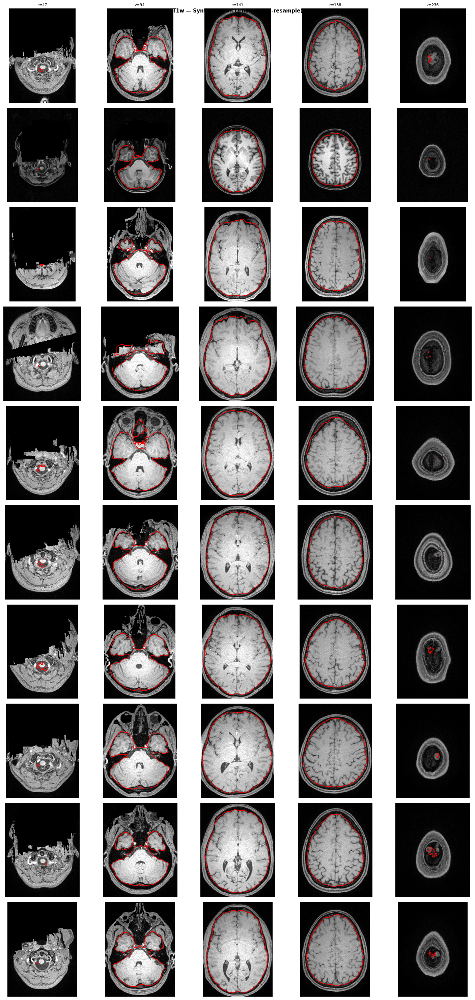

✓ Saved mask_orig_qc_t1w.png


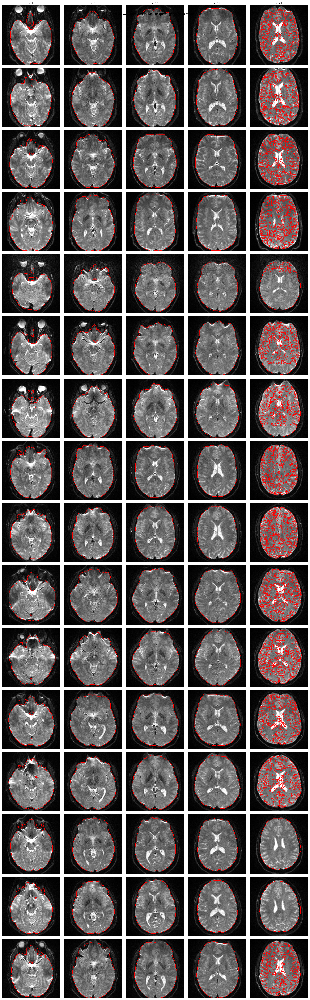

✓ Saved mask_orig_qc_dwi.png


In [7]:
ok_m = df_mask[df_mask.status.isin(['ok', 'skipped']) &
               df_mask.mask_path.map(lambda p: Path(p).exists())]

for mod in ['T1w', 'DWI']:
    sub_df = ok_m[ok_m.modality == mod]
    if sub_df.empty:
        print(f'⚠ No {mod} masks'); continue

    n_subs = len(sub_df)
    n_cols  = 5
    fig, axes = plt.subplots(n_subs, n_cols, figsize=(n_cols * 3, n_subs * 3))
    if n_subs == 1: axes = axes[np.newaxis, :]
    fig.suptitle(f'{mod} — SynthStrip on Original (pre-resample)', fontsize=11, fontweight='bold')

    for ri, (_, r) in enumerate(sub_df.iterrows()):
        img_path = r.orig_path
        img  = nib.load(img_path).get_fdata(dtype=np.float32)
        mask = nib.load(r.mask_path).get_fdata(dtype=np.float32)
        if img.ndim == 4: img = img[..., 0]

        # ensure mask matches img shape
        if mask.shape != img.shape[:3]:
            zf = np.array(img.shape[:3]) / np.array(mask.shape[:3])
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                mask_r = sp_zoom(mask, zf, order=0)
            result = np.zeros(img.shape[:3], np.float32)
            s = tuple(slice(0, min(a,b)) for a,b in zip(img.shape[:3], mask_r.shape))
            result[s] = mask_r[s]
            mask = result

        brain_z = np.where(mask.any(axis=(0, 1)))[0]
        z_lo = int(brain_z[0])  if len(brain_z) else int(img.shape[2] * 0.1)
        z_hi = int(brain_z[-1]) if len(brain_z) else int(img.shape[2] * 0.9)
        zs   = np.linspace(z_lo, z_hi, n_cols, dtype=int)

        brain_vox = img[mask > 0]
        vmin = float(brain_vox.min()) if len(brain_vox) else 0
        vmax = float(np.percentile(brain_vox, 99)) if len(brain_vox) else 1

        for ci, z in enumerate(zs):
            ax = axes[ri, ci]
            ax.imshow(np.rot90(img[:, :, z]),  cmap='gray', vmin=vmin, vmax=vmax)
            if mask[:, :, z].any():
                ax.contour(np.rot90(mask[:, :, z]), levels=[0.5], colors='red', linewidths=1.2)
            ax.axis('off')
            if ri == 0: ax.set_title(f'z={z}', fontsize=8)
        axes[ri, 0].set_ylabel(f"{r.subject}\n{r.session}",
                               fontsize=8, rotation=0, labelpad=50, va='center')

    plt.tight_layout()
    out_f = OUTPUT_ROOT / 'qc' / f'mask_orig_qc_{mod.lower()}.png'
    plt.savefig(out_f, dpi=120, bbox_inches='tight')
    plt.show()
    print(f'✓ Saved {out_f.name}')

## Cell 4 — Resample + Crop to Brain

For each file:
1. Resample original image **and** mask to 2 mm iso
2. Find brain bounding box from the resampled mask
3. Crop image + mask to bounding box + `BRAIN_MARGIN` voxels, then pad/crop to `TARGET_SHAPE`

In [ ]:
def resample_to_vox(img, target_vox, order=3):
    """Resample NIfTI image to isotropic voxel size."""
    data = img.get_fdata(dtype=np.float32)
    cur  = np.array(img.header.get_zooms()[:3], dtype=float)
    zf   = cur / np.array(target_vox)
    if data.ndim == 4:
        vols = []
        for v in range(data.shape[-1]):
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                vols.append(sp_zoom(data[..., v], zf, order=order))
        out = np.stack(vols, axis=-1)
    else:
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            out = sp_zoom(data, zf, order=order)
    aff = img.affine.copy()
    aff[:3, :3] = img.affine[:3, :3] / zf
    new = nib.Nifti1Image(out, aff, img.header)
    new.header.set_zooms(tuple(target_vox) + img.header.get_zooms()[3:])
    return new


def crop_to_brain(img, mask_data, target_shape, margin=8):
    """
    Crop img to the brain bounding box (from mask_data) + margin,
    then pad/crop to target_shape.
    mask_data must be in the same voxel space as img.
    """
    data  = img.get_fdata(dtype=np.float32)
    is4d  = data.ndim == 4

    # bounding box of brain mask
    brain_vox = np.where(mask_data > 0.5)
    if len(brain_vox[0]) == 0:
        raise ValueError('Empty mask — cannot crop to brain')

    lo = [max(brain_vox[d].min() - margin, 0)           for d in range(3)]
    hi = [min(brain_vox[d].max() + margin + 1, data.shape[d]) for d in range(3)]

    # crop to bounding box
    sl   = tuple(slice(lo[d], hi[d]) for d in range(3))
    data = data[sl[0], sl[1], sl[2], ...] if is4d else data[sl[0], sl[1], sl[2]]
    mask_crop = mask_data[sl[0], sl[1], sl[2]]

    # pad or crop each axis to target_shape, centred
    pads = []
    crops = []
    for d, (cur, tgt) in enumerate(zip(data.shape[:3], target_shape)):
        if cur < tgt:
            p = tgt - cur
            pads.append((p // 2, p - p // 2))
            crops.append(slice(None))
        elif cur > tgt:
            s = (cur - tgt) // 2
            pads.append((0, 0))
            crops.append(slice(s, s + tgt))
        else:
            pads.append((0, 0))
            crops.append(slice(None))

    data      = data[crops[0], crops[1], crops[2], ...] if is4d else data[crops[0], crops[1], crops[2]]
    mask_crop = mask_crop[crops[0], crops[1], crops[2]]
    data      = np.pad(data, pads + [(0, 0)] if is4d else pads)
    mask_out  = np.pad(mask_crop, pads)

    aff = img.affine.copy()
    # update affine origin for the crop
    shift = np.array([lo[d] + (crops[d].start or 0) - pads[d][0] for d in range(3)], dtype=float)
    aff[:3, 3] += img.affine[:3, :3] @ shift

    return nib.Nifti1Image(data, aff, img.header), mask_out


# ── Run resample + crop ────────────────────────────────────────────────────────
FORCE_RERUN = False

rs_log = []
for _, row in tqdm(df_mask[df_mask.status.isin(['ok','skipped'])].iterrows(),
                   total=len(df_mask[df_mask.status.isin(['ok','skipped'])]),
                   desc='Resample+Crop'):
    sub, ses, mod = row.subject, row.session, row.modality
    out_dir = OUTPUT_ROOT / 'resampled' / sub / ses / mod.lower()
    out_dir.mkdir(parents=True, exist_ok=True)

    orig_name = Path(row.orig_path).name
    stem      = orig_name.replace('.nii.gz','').replace('.nii','')
    out_img   = out_dir / orig_name
    out_mask  = out_dir / f'{stem}_mask.nii.gz'

    if out_img.exists() and not FORCE_RERUN:
        rs_log.append(dict(subject=sub, session=ses, modality=mod,
                           out_path=str(out_img), mask_path=str(out_mask),
                           bval=row.bval, status='skipped'))
        continue
    try:
        # resample image
        img_orig  = nib.load(row.orig_path)
        img_rs    = resample_to_vox(img_orig, TARGET_VOX, order=3)

        # resample mask (nearest-neighbour)
        mask_orig = nib.load(row.mask_path)
        mask_rs   = resample_to_vox(mask_orig, TARGET_VOX, order=0)
        mask_data = (mask_rs.get_fdata(dtype=np.float32) > 0.5).astype(np.float32)

        # crop both to brain bbox
        img_cropped, mask_cropped = crop_to_brain(
            img_rs, mask_data, TARGET_SHAPE, margin=BRAIN_MARGIN)

        nib.save(img_cropped, str(out_img))
        nib.save(nib.Nifti1Image(mask_cropped, img_cropped.affine), str(out_mask))

        # copy bval/bvec for DWI
        if mod == 'DWI' and row.bval:
            for ext in ['.bval', '.bvec']:
                src = Path(row.orig_path.replace('.nii.gz','') + ext)
                if src.exists(): shutil.copy2(src, out_dir / src.name)

        rs_log.append(dict(subject=sub, session=ses, modality=mod,
                           out_path=str(out_img), mask_path=str(out_mask),
                           bval=row.bval, status='ok',
                           final_shape=img_cropped.shape[:3]))
        print(f'  ✓ {sub}/{ses} {mod}  → {img_cropped.shape[:3]}')
    except Exception as e:
        rs_log.append(dict(subject=sub, session=ses, modality=mod,
                           out_path=str(out_img), mask_path=str(out_mask),
                           bval=row.bval, status=f'ERROR: {e}'))
        print(f'  ✗ {sub}/{ses} {mod}: {e}')

df_rs = pd.DataFrame(rs_log)
print('\nResample+Crop summary:')
print(df_rs.status.value_counts().to_string())

Resample+Crop:   0%|          | 0/26 [00:00<?, ?it/s]

Resample+Crop:   8%|▊         | 2/26 [02:40<32:11, 80.48s/it]

  ✓ sub-02/ses-1 DWI  → (192, 192, 192)


Resample+Crop:  12%|█▏        | 3/26 [05:25<44:12, 115.31s/it]

  ✓ sub-02/ses-2 DWI  → (192, 192, 192)


Resample+Crop:  15%|█▌        | 4/26 [05:32<27:31, 75.05s/it] 

  ✓ sub-03/ses-1 T1w  → (192, 192, 192)


Resample+Crop:  19%|█▉        | 5/26 [08:11<36:28, 104.21s/it]

  ✓ sub-03/ses-1 DWI  → (192, 192, 192)


Resample+Crop:  23%|██▎       | 6/26 [08:18<24:01, 72.09s/it] 

  ✓ sub-04/ses-1 T1w  → (192, 192, 192)


## Cell 4b — QC: After Resample + Brain Crop

In [ ]:
ok_rs = df_rs[df_rs.status.isin(['ok', 'skipped'])]
t1_rs = ok_rs[ok_rs.modality == 'T1w']

if t1_rs.empty:
    print('⚠ No resampled T1w files')
else:
    n = len(t1_rs)
    fig, axes = plt.subplots(n, 3, figsize=(12, n * 3.5))
    if n == 1: axes = axes[np.newaxis, :]
    fig.suptitle('After Resample + Brain Crop (brain voxels only, no mask overlay)', fontsize=11)

    for si, (_, row) in enumerate(t1_rs.iterrows()):
        img  = nib.load(row.out_path).get_fdata(dtype=np.float32)
        mask = nib.load(row.mask_path).get_fdata(dtype=np.float32)
        if img.ndim == 4: img = img[..., 0]

        # zero out non-brain voxels so only brain is shown
        img_brain = img * (mask > 0).astype(np.float32)

        cx, cy, cz = [s // 2 for s in img.shape[:3]]
        brain_vox = img_brain[mask > 0]
        vmin = float(np.percentile(brain_vox, 1))  if len(brain_vox) else 0
        vmax = float(np.percentile(brain_vox, 99)) if len(brain_vox) else 1

        for col, (title, plane) in enumerate([
            ('Sagittal', img_brain[cx, :, :]),
            ('Coronal',  img_brain[:, cy, :]),
            ('Axial',    img_brain[:, :, cz]),
        ]):
            ax = axes[si, col]
            ax.imshow(np.rot90(plane), cmap='gray', vmin=vmin, vmax=vmax)
            ax.axis('off')
            if si == 0: ax.set_title(title, fontsize=9)
        axes[si, 0].set_ylabel(f"{row.subject} {row.session}\n{img.shape[:3]}",
                               fontsize=7, rotation=0, labelpad=80, va='center')

    plt.tight_layout()
    plt.savefig(OUTPUT_ROOT / 'qc' / 'resample_crop_qc.png', dpi=120, bbox_inches='tight')
    plt.show()
    print('✓ Saved resample_crop_qc.png')
    print('\nFinal shapes:')
    for _, row in t1_rs.iterrows():
        print(f'  {row.subject} {row.session}: {nib.load(row.out_path).shape[:3]}')

## Cell 5 — Augmentation (DWI only)

In [ ]:
import gc

def znorm(vol, mask):
    brain = vol[mask > 0]
    return (vol - brain.mean()) / (brain.std() + 1e-8)

def augment_noise(vol, std_range=(0.02, 0.08)):
    std = np.random.uniform(*std_range)
    ni  = (vol + np.random.normal(0, std, vol.shape)).astype(np.float32)
    nt  = (vol + np.random.normal(0, std, vol.shape)).astype(np.float32)
    return ni, nt

def random_flip(vol):
    for axis in range(3):
        if np.random.rand() > 0.5:
            vol = np.flip(vol, axis=axis)
    return np.ascontiguousarray(vol)


FORCE_REAGG = False
np.random.seed(RANDOM_SEED)
aug_log = []

dwi_rows = df_rs[df_rs.modality == 'DWI']
for _, row in tqdm(dwi_rows.iterrows(), total=len(dwi_rows), desc='Augmentation'):
    sub, ses = row.subject, row.session
    rs_path  = Path(row.out_path)
    mask_path= Path(row.mask_path)
    stem     = rs_path.name.replace('.nii.gz','').replace('.nii','')
    out_path = OUTPUT_ROOT / 'augmented' / sub / ses / f'{stem}_aug.npz'
    out_path.parent.mkdir(parents=True, exist_ok=True)

    if not rs_path.exists() or not mask_path.exists():
        print(f'  ⚠ {sub}/{ses}: missing resampled DWI or mask'); continue

    if out_path.exists() and not FORCE_REAGG:
        d = np.load(str(out_path), mmap_mode='r')
        aug_log.append(dict(subject=sub, session=ses,
                            n_pairs=d['inputs'].shape[0], file=str(out_path)))
        continue

    mask_data = (nib.load(str(mask_path)).get_fdata(dtype=np.float32) > 0.5).astype(np.uint8)
    dwi_img   = nib.load(str(rs_path))
    n_vols    = dwi_img.shape[-1]
    n_per_vol = 1 + N_AUGMENTS
    total     = n_vols * n_per_vol
    vshape    = dwi_img.shape[:3]

    all_ni = np.zeros((total, *vshape), dtype=np.float32)
    all_nt = np.zeros((total, *vshape), dtype=np.float32)

    for v in range(n_vols):
        vol  = dwi_img.dataobj[..., v].astype(np.float32)
        vol  = znorm(vol, mask_data)
        base = v * n_per_vol
        ni, nt = augment_noise(vol)
        all_ni[base] = ni; all_nt[base] = nt
        for a in range(N_AUGMENTS):
            f = random_flip(vol.copy())
            ni, nt = augment_noise(f)
            all_ni[base + 1 + a] = ni; all_nt[base + 1 + a] = nt
        del vol; gc.collect()

    np.savez_compressed(str(out_path), inputs=all_ni, targets=all_nt)
    del all_ni, all_nt, mask_data; gc.collect()
    aug_log.append(dict(subject=sub, session=ses, n_pairs=total, file=str(out_path)))
    print(f'  ✓ {sub}/{ses}: {total} pairs  ({n_vols} vols × {n_per_vol})')

df_aug = pd.DataFrame(aug_log) if aug_log else pd.DataFrame(
    columns=['subject','session','n_pairs','file'])
print(f'\nTotal augmented pairs: {int(df_aug.n_pairs.sum()):,}')

KeyboardInterrupt: 

## Cell 6 — Train / Val / Test Split

In [ ]:
import json as json_lib

np.random.seed(RANDOM_SEED)
subs = df_aug.subject.unique()
perm = np.random.permutation(subs); n = len(perm)
n_test = max(1, round(n * 0.15))
n_val  = max(1, round(n * 0.15))
test_s  = list(perm[-n_test:])
val_s   = list(perm[-(n_test + n_val):-n_test])
train_s = list(perm[:-(n_test + n_val)])

df_aug['split'] = df_aug.subject.map(
    lambda s: 'train' if s in train_s else ('val' if s in val_s else 'test'))

print('Split:')
print(df_aug.groupby('split').agg(
    subjects=('subject','nunique'), pairs=('n_pairs','sum')).to_string())

manifest_path = OUTPUT_ROOT / 'split_manifest.json'
with open(manifest_path, 'w') as f:
    json_lib.dump(dict(train=train_s, val=val_s, test=test_s,
        files=df_aug[['subject','session','split','file']].to_dict('records')), f, indent=2)
print(f'✓ Saved {manifest_path}')

colors = {'train':'#2196F3','val':'#FF9800','test':'#4CAF50'}
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
split_counts = df_aug.groupby('split').n_pairs.sum()
axes[0].pie(split_counts, labels=split_counts.index, autopct='%1.0f%%',
            colors=[colors.get(k,'grey') for k in split_counts.index], startangle=90)
axes[0].set_title('Pairs by split')
axes[1].bar(range(len(df_aug)), df_aug.n_pairs,
            color=[colors.get(r['split'],'grey') for _,r in df_aug.iterrows()])
axes[1].set_xticks(range(len(df_aug)))
axes[1].set_xticklabels([f"{r.subject}\n{r.session}" for _,r in df_aug.iterrows()], fontsize=7)
axes[1].set_title('Pairs per subject/session')
from matplotlib.patches import Patch
axes[1].legend(handles=[Patch(color=v,label=k) for k,v in colors.items()])
plt.tight_layout()
plt.savefig(OUTPUT_ROOT/'qc'/'split_qc.png', dpi=120, bbox_inches='tight')
plt.show()
print('✓ Saved split_qc.png')

## Cell 7 — Summary

In [ ]:
print('=' * 55)
print('  MRI PIPELINE — SUMMARY')
print('=' * 55)
print(f'  Pipeline order  : SynthStrip → Resample → Brain Crop')
print(f'  Target vox      : {TARGET_VOX} mm')
print(f'  Target shape    : {TARGET_SHAPE}')
print(f'  Brain margin    : {BRAIN_MARGIN} vox')
print(f'  SynthStrip ok   : {(df_mask.status.isin(["ok","skipped"])).sum()} / {len(df_mask)}')
print(f'  Resampled ok    : {(df_rs.status.isin(["ok","skipped"])).sum()} / {len(df_rs)}')
print(f'  Aug pairs total : {int(df_aug.n_pairs.sum()):,}')
print(f'  Train subjects  : {train_s}')
print(f'  Val subjects    : {val_s}')
print(f'  Test subjects   : {test_s}')
print('=' * 55)